# MBRT X-Ray classifier voor studenten
Deze classifier kan gebruikt worden door studenten MBRT om de kwaliteit van de gemaakte röntgenfoto's in het skillslab te beoordelen. Er wordt gebruik gemaakt van een zelf verkregen dataset van afbeeldingen die in een bucky kamer gemaakt zijn op een daarvoor gemaakte pop.

![X-ray Room](Xray_room.png)

# Inladen en het pad aanwijzen
In de onderstaande code worden eerst de paketten die we gaan gebruiken ingeladen. Daarna geven we ook aan waar de afbeeldingen staan die de classifier kan gaan gebruiken. 

In [83]:
import os, pandas, platform, torch, torchvision, pytorch_lightning

torch.manual_seed(42)

data_path = "D:\\Minor\\Classification\\X-ray\\Flip data"

print("Versions: python", platform.python_version(), "| torch", torch.__version__, "| torchvision", torchvision.__version__, "| pytorch_lightning", pytorch_lightning.__version__, "| pandas", pandas.__version__)

Versions: python 3.13.2 | torch 2.6.0+cpu | torchvision 0.21.0+cpu | pytorch_lightning 2.5.0.post0 | pandas 2.2.3


# Controle
Om te controleren of de classifier goed bij de afbeeldingen kan en deze op een juiste manier worden weergegeven doen we een korte test waarbij we een afbeelding oproepen.

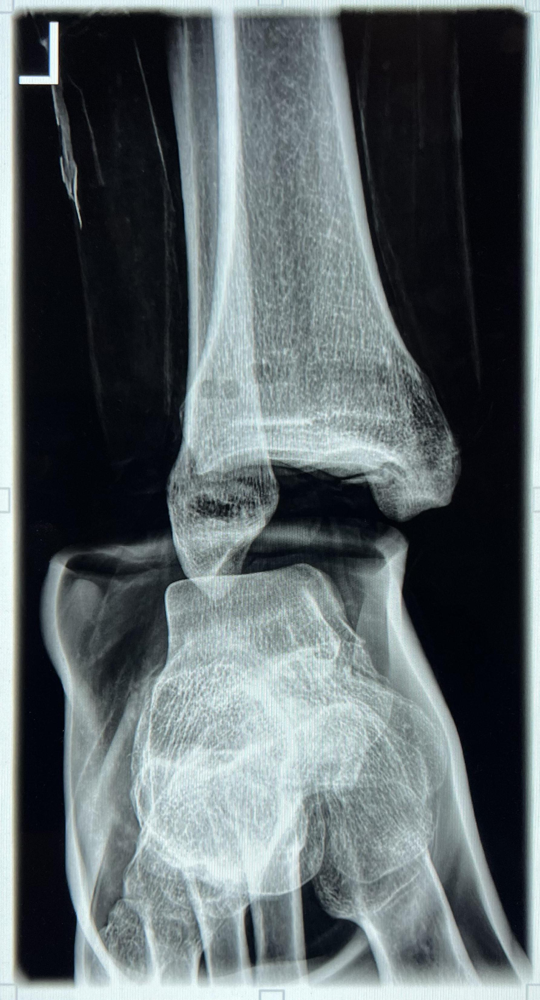

In [84]:
import PIL

img=PIL.Image.open('D:\\Minor\\Classification\\X-ray\\Flip data\\over-exposed\\IMG_9623_flipH.jpg')
img

# Inladen van het model
Voor deze classifier maak ik gebruik van een ResNet model. Ik maak gebruik van ResNet50. Deze is zwaarder en heeft bij het trainen dus langer de tijd nodig. Hierdoor wordt de classifier wel accuraater.

In [85]:
from torchvision import models

pretrained_model = models.resnet50(weights="DEFAULT")

# Transformeren
Onderstaande code gaat er voor zorgen dat alle afbeeldingen even groot zijn. Dit maakt het makkelijker voor de classifier.

In [86]:
from torchvision import transforms

image_size = (244, 244)

transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
])

# Augmentatie
Om er voor te zorgen dat we meer data hebben zonder meer data te verkrijgen gaan we gebruik maken van data augmentatie. Dit zorgt er voor dat de afbeeldingen lichtjes anders zijn door kleine aanpassingen. Hierdoor heeft de classifier wel meer data om mee te werken zonder dat wij daar veel moeite voor moeten doen. In de eerste cel worden deze afbeeldingen gemaakt. In die daaronder kunnen we zien dat de augmentatie gewerkt heeft door een voorbeeld op te roepen.

In [87]:
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import random_split

train_transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    transforms.RandomResizedCrop(size=224, scale=(0.9, 1.0)),
    transforms.RandomRotation(degrees=10),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])
])

val_transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])
])

data_path = "D:\\Minor\\Classification\\X-ray\\Flip data"

full_dataset_train = ImageFolder(root=data_path, transform=train_transform)
full_dataset_val = ImageFolder(root=data_path, transform=val_transform)

train_size = int(0.8 * len(full_dataset_train))
val_size = len(full_dataset_train) - train_size

train_dataset, _ = random_split(full_dataset_train, [train_size, val_size])
_, val_dataset = random_split(full_dataset_val, [train_size, val_size])

classes = full_dataset_train.classes

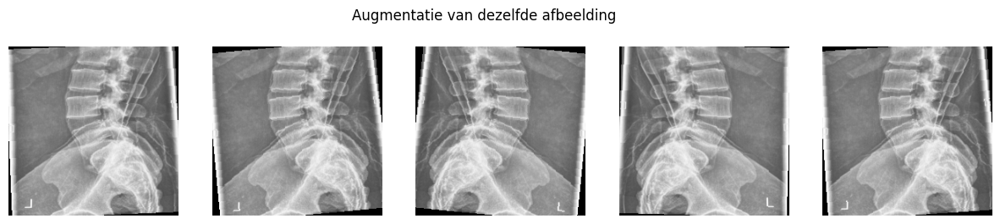

In [88]:
import matplotlib.pyplot as plt

img, label = train_dataset[0]  

fig, axs = plt.subplots(1, 5, figsize=(15, 3))
for i in range(5):
    img_aug, _ = train_dataset[0]  
    axs[i].imshow(img_aug.permute(1, 2, 0), cmap='gray')
    axs[i].axis('off')
plt.suptitle("Augmentatie van dezelfde afbeelding")
plt.show()

# Een data module maken
Nu gaan we de data splitsen en dat noemen we een data module. We gaan de data splitsen in trainen, validatie en test data. Onderaan de code worden ook de namen van de mappen weergeven als een extra controle.

In [89]:
import os
import numpy as np
from pytorch_lightning import LightningDataModule
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import StratifiedShuffleSplit

class ImageFolderDataSet(LightningDataModule):
    def __init__(self, path, transform, split=[0.7, 0.2, 0.1], batch_size=32, num_workers=None):
        super().__init__()
        self.path = path
        self.split = split
        self.batch_size = batch_size
        self.num_workers = num_workers if num_workers is not None else int(os.cpu_count() / 2)
        self.transform = transform

    def setup(self, stage=None):
        full_dataset = ImageFolder(self.path, transform=self.transform)
        targets = np.array(full_dataset.targets)
        class_to_idx = full_dataset.class_to_idx

        if 'Good' in class_to_idx:
            good_class_index = class_to_idx['Good']
            other_indices = [i for i, target in enumerate(targets) if target != good_class_index]
        else:
            other_indices = list(range(len(full_dataset)))

        other_targets = targets[other_indices]
        sss1 = StratifiedShuffleSplit(n_splits=1, test_size=self.split[2], random_state=42)
        train_val_idx, test_idx = next(sss1.split(other_indices, other_targets))

        train_val_indices = np.array(other_indices)[train_val_idx]
        test_indices = np.array(other_indices)[test_idx]

        val_size = self.split[1] / (self.split[0] + self.split[1])
        train_val_targets = targets[train_val_indices]
        sss2 = StratifiedShuffleSplit(n_splits=1, test_size=val_size, random_state=42)
        train_idx, val_idx = next(sss2.split(train_val_indices, train_val_targets))

        self.train = Subset(full_dataset, train_val_indices[train_idx])
        self.val = Subset(full_dataset, train_val_indices[val_idx])
        self.test = Subset(full_dataset, test_indices)

        self.data = full_dataset

    def train_dataloader(self):
        return DataLoader(self.train, shuffle=True, batch_size=self.batch_size,
                          num_workers=self.num_workers, persistent_workers=True)

    def val_dataloader(self):
        return DataLoader(self.val, batch_size=self.batch_size,
                          num_workers=self.num_workers, persistent_workers=True)

    def test_dataloader(self):
        return DataLoader(self.test, batch_size=self.batch_size,
                          num_workers=self.num_workers, persistent_workers=True)

    def classes(self):
        return [cls for cls in self.data.classes if cls != 'Good']

dataset = ImageFolderDataSet(data_path, transform)
dataset.setup()
classes = dataset.classes()
print("Created an image dataset for classes:", classes)


Created an image dataset for classes: ['big', 'over-exposed', 'small', 'under-exposed']


# Afbeelding classifier model
Er gaat nu gebruik gemaakt worden van LightningModule. Deze gaat het ResNet model pakken en deze fine-tunen. Er wordt gebruik gemaakt van de categorieën: Accuraatheid (accuarcy), precisie (precision) en terugroepen (recall). Hiermee kunnen we later visualizeren hoe goed het model het heeft gedaan. Daarnaast wordt er in deze code ook de parameters vastgezet die er voor gaan zorgen dat het trainen optijd stopt.

In [90]:
from pytorch_lightning import LightningModule
from torch import nn
import torch
import torch.nn.functional as F
from torchmetrics import Accuracy, Precision, Recall

class ImageClassifierModel(LightningModule):
    def __init__(self, pretrained_model, num_classes, freeze_layers=True):
        super().__init__()
        self.num_classes = num_classes
        self.model = pretrained_model
        if freeze_layers:
            for param in self.model.parameters(): 
                param.requires_grad = False
        self.model.fc = nn.Linear(self.model.fc.in_features, 4)
        self.criterion = nn.CrossEntropyLoss()
        self.accuracy = Accuracy(task="multiclass", num_classes=self.num_classes, average="none")
        self.precision = Precision(task="multiclass", num_classes=self.num_classes, average="none")
        self.recall = Recall(task="multiclass", num_classes=self.num_classes, average="none") 
    
    def forward(self, x):
        return self.model(x)
    
    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.002) 

    def training_step(self, batch):
        x, y = batch
        logits = self(x)
        return self.criterion(logits, y)
    
    def validation_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = F.cross_entropy(y_hat, y)
        
        preds = torch.argmax(y_hat, dim=1)
        acc = (preds == y).float().mean()  
        
        self.log("val_loss", loss, prog_bar=True)
        self.log("val_accuracy", acc, prog_bar=True) 

    def test_step(self, batch):
        x, y = batch
        logits = self(x)
        preds = logits.argmax(dim=1)
        self.accuracy(preds, y)
        self.precision(preds, y)
        self.recall(preds, y)
    
    def predict_step(self, batch):
        x, y = batch
        logits = self(x)
        return logits

    def on_test_epoch_end(self):
        accuracy = self.accuracy.compute()
        precision = self.precision.compute()
        recall = self.recall.compute()
        for i in range(self.num_classes):
            self.log("test_accuracy_class_" + str(i), accuracy[i])
            self.log("test_precision_class_" + str(i), precision[i])
            self.log("test_recall_class_" + str(i), recall[i])            

model = ImageClassifierModel(pretrained_model, num_classes=len(classes))

# Trainen
Wanneer deze cel gestart wordt begint ook meteen het trainen van het model. Er is zo ingesteld dat het model stopt met trainen zodra er een accuraatheid van 1.0 wordt behaald en er voor de volgende 15 epochs geen verbeteringen zijn. Zodra dit is bereikt stopt het model automatisch. Voor de zekerheid heb ik er nog wel bij gezet dat hij bij de 100 epochs moet stoppen (dit zal niet zo maar voorkomen).

In [91]:
from pytorch_lightning.loggers import CSVLogger 
from pytorch_lightning.callbacks.early_stopping import EarlyStopping
from pytorch_lightning import Trainer

logger = CSVLogger(save_dir=".")

early_stopping = EarlyStopping(
    monitor="val_accuracy", 
    patience=15, 
    mode="max", 
    stopping_threshold= 1.0
)

trainer = Trainer(max_epochs=100, logger=logger, callbacks=[early_stopping])
trainer.fit(model, datamodule=dataset)


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name      | Type                | Params | Mode 
----------------------------------------------------------
0 | model     | ResNet              | 23.5 M | train
1 | criterion | CrossEntropyLoss    | 0      | train
2 | accuracy  | MulticlassAccuracy  | 0      | train
3 | precision | MulticlassPrecision | 0      | train
4 | recall    | MulticlassRecall    | 0      | train
----------------------------------------------------------
8.2 K     Trainable params
23.5 M    Non-trainable params
23.5 M    Total params
94.065    Total estimated model params size (MB)
155       Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\femke\AppData\Local\Programs\Python\Python313\Lib\site-packages\pytorch_lightning\loops\fit_loop.py:310: The number of training batches (6) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

# Visualizatie van het trainen
Om nu goed visueel te krijgen hoe het model zich heeft getraind maken we een grafiek die het verloop van de epochs laat zien.

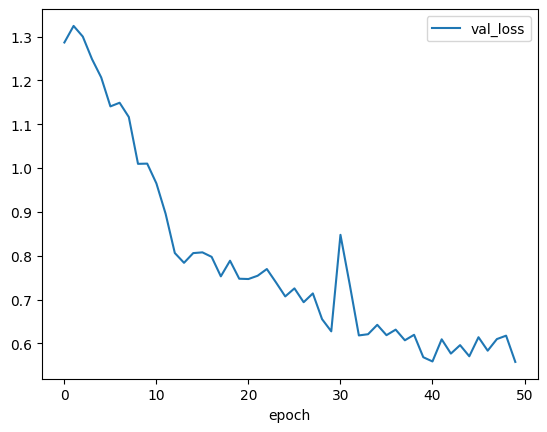

In [92]:
metrics = pandas.read_csv(os.path.join(trainer.log_dir, "metrics.csv"))
loss_metrics = metrics[["epoch", "val_loss"]].set_index("epoch")
plot = loss_metrics.plot()

# Score tabel
Ik had het eerder over de accuraatheid, de precisie en het terugroepen. Deze gaan we nu in een score tabel hieronder zetten voor een goed overzicht bij de verschillende klasses.

In [93]:
scores = trainer.test(model, datamodule=dataset, verbose=False)
accuracies = [scores[0]["test_accuracy_class_" + str(i)] for i in range(len(classes))]
precisions = [scores[0]["test_precision_class_" + str(i)] for i in range(len(classes))]
recalls = [scores[0]["test_recall_class_" + str(i)] for i in range(len(classes))]
df = pandas.DataFrame({"class": classes, "accuracy": accuracies, "precision": precisions, "recall": recalls}).set_index("class")
df

Testing: |          | 0/? [00:00<?, ?it/s]

,accuracy,precision,recall
class,,,
big,1.000000,0.714286,1.000000
over-exposed,0.714286,1.000000,0.714286
small,1.000000,0.833333,1.000000
under-exposed,0.714286,0.833333,0.714286


# Inference
Inference: "AI inference is het proces waarbij een AI-model of algoritme gebruikmaakt van zijn AI-training om conclusies te trekken op basis van nieuwe gegevens." Of terwijl we gaan nu ons getrained model loslaten op te testdata. Dit proces moet eerst gestart worden met de cel hieronder. De cel daar weer onder gaat er voor zorgen dat de bevindingen van het model visueel wordt gemaakt. Hierbij komt de test afbeelding te voorschijn en daarbij ook percentages voor iedere klasse. Hoe hoeger het percentage hoe meer het model dacht dat de afbeelding bij dat label hoorde. Zodra de tekst in het zwart is had de classifier het juiste label er aan gehangen. Is deze rood dan zat het model er naast.

In [94]:
inference_dataloader = dataset.test_dataloader()
preds = trainer.predict(model, dataloaders=inference_dataloader)
predictions = torch.cat(preds)
images = torch.cat([x for x, y in inference_dataloader])
labels = torch.cat([y for x, y in inference_dataloader])

Predicting: |          | 0/? [00:00<?, ?it/s]

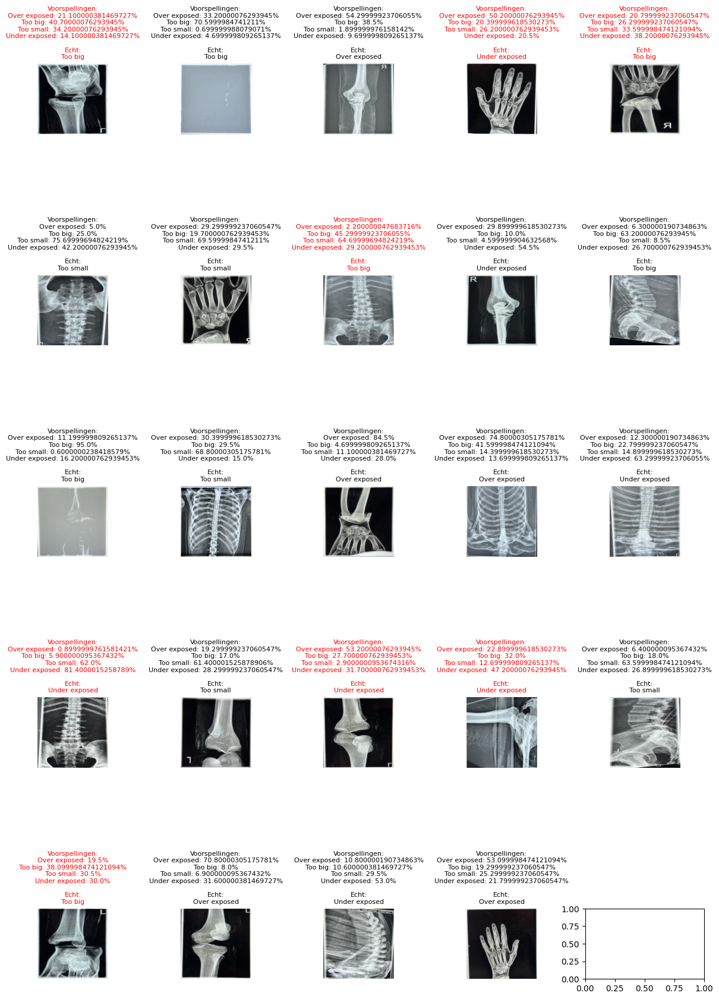

In [95]:
import torch
import matplotlib.pyplot as plt

fig, axs = plt.subplots(5, 5, figsize=(15, 20))  
axs = axs.flatten()

classes = ['Over exposed', 'Too big', 'Too small', 'Under exposed']

for i, (image, truth, prediction) in enumerate(zip(images, labels, predictions)):
    if i >= len(axs):  
        break

    if prediction.dim() == 0:
        probabilities = torch.sigmoid(prediction.unsqueeze(0))
    else:
        probabilities = torch.sigmoid(prediction)

    if probabilities.shape[0] != len(classes):
        axs[i].text(0.5, 0.5, f"Fout: verkeerde outputvorm ({probabilities.shape})", 
                    ha='center', va='center', color='red', fontsize=10)
        axs[i].axis("off")
        continue

    error_probs_percent = (probabilities * 100).round(decimals=1)

    pred_text = "\n".join([f"{label}: {prob.item()}%" for label, prob in zip(classes, error_probs_percent)])

    if truth.dim() == 0:
        truth_indices = [truth.item()]
    else:
        truth_indices = (truth > 0).nonzero(as_tuple=True)[0].tolist()

    truth_text = "\n".join([classes[idx] for idx in truth_indices if 0 <= idx < len(classes)]) or "Good"

    predicted_indices = (probabilities > 0.5).nonzero(as_tuple=True)[0].tolist()
    predicted_labels = [classes[i] for i in predicted_indices]

    true_labels = [classes[i] for i in truth_indices if 0 <= i < len(classes)]
    is_correct = set(predicted_labels) == set(true_labels)

    axs[i].imshow(image.permute(1, 2, 0).numpy())
    axs[i].set_title(f"Voorspellingen:\n{pred_text}\n\nEcht:\n{truth_text}", 
                     color="black" if is_correct else "red",
                     fontsize=8)
    axs[i].axis("off")

plt.subplots_adjust(hspace=2)
plt.show()

# Confusion matrix
Het plaatje hierboven geeft mooi per afbeelding weer wat de resultaten zijn. Om een conclusie over het model te kunnen trekken wil ik graag ook een algemeen overzicht dat mij verteld hoeveel de classifier fout had en of er uit de fouten een logische conclusie valt te halen. Hiervoor maak ik gebruik van een confusion matrix. Dit wil zeggen er een schuine lijn van links boven naar rechts onder wordt verwacht. Dit geeft namelijk aan dat alles perfect is gegaan. Afbeeldingen die daar buiten staan waren dus fout maar hierdoor kan snel gezien worden of die fouten ook logisch zijn.

Predicting: |          | 0/? [00:00<?, ?it/s]

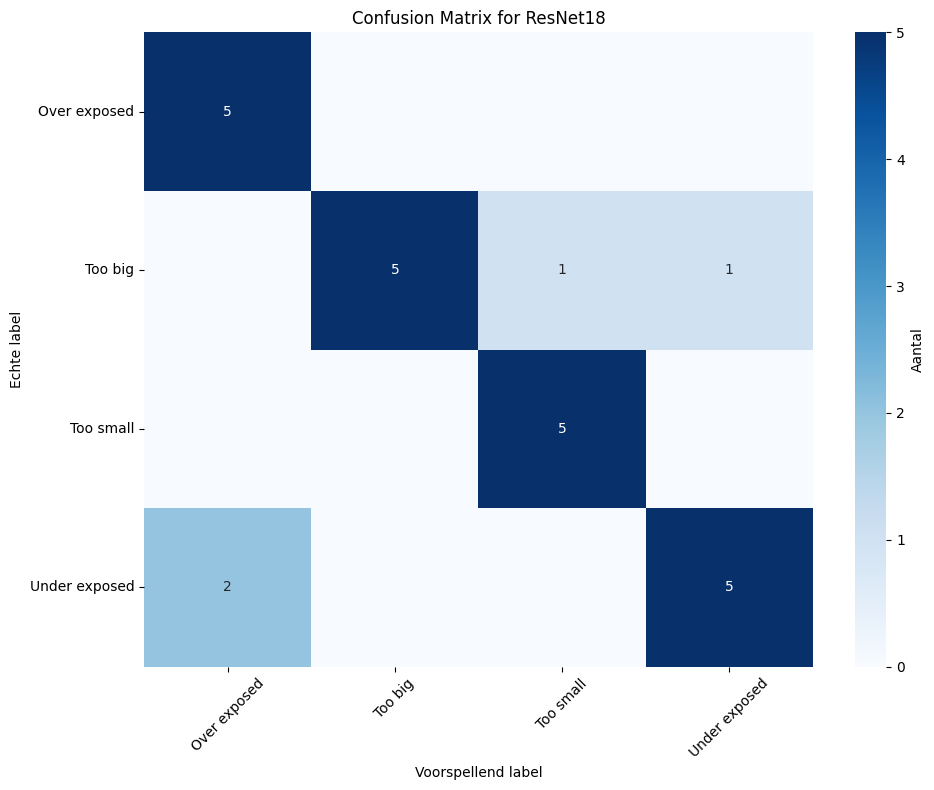

Total amount of test images: 24


In [106]:
import torch
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns
import numpy as np

label_names = ['Over exposed', 'Too big', 'Too small', 'Under exposed']

inference_dataloader = dataset.test_dataloader()

preds = trainer.predict(model, dataloaders=inference_dataloader)

predictions_raw = torch.cat(preds)

if predictions_raw.ndim == 2 and predictions_raw.shape[1] > 1:
    predictions = torch.argmax(predictions_raw, dim=1)
else:
    predictions = predictions_raw

labels = torch.cat([y for x, y in inference_dataloader])

cm = confusion_matrix(labels.numpy(), predictions.numpy())

annot = np.where(cm == 0, "", cm.astype(str))

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=annot, fmt='', cmap='Blues',
            xticklabels=label_names, yticklabels=label_names,
            cbar_kws={'label': 'Aantal'})

plt.xlabel('Voorspellend label')
plt.ylabel('Echte label')
plt.title('Confusion Matrix for ResNet18')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

print(f"Total amount of test images: {cm.sum()}")

# Conclusie confusion matrix
Over het algemeen doet de classifier het heel goed. Hij heeft op een paar na alles goed. De fouten die gemaakt zijn, zijn niet genoeg om er een goede conclusie over te kunnen trekken. De fouten zijn verschillend en hebben zo snel niet perse iets met elkaar te maken. Het zijn sowieso al lastige afbeeldingen die ik hem heb gegeven omdat de fouten breed en lastig geïnterpreteerd kunnen worden. Doordat de afbeeldingen hetzelfde formaat krijgen is het soms lastig om te zien of de afbeelding te breed of te smal is.

# Bar plot
Naast de confusion matrix wil ik nog een ander visueel overzicht. Ik ben namelijk ook nieuwschierig naar de visualizatie van de labels per test afbeelding. Dit geeft eigenlijk visueel weer wat de waardes zijn die de classifier aan iedere test afbeelding heeft gehangen. Aan de bovenkant van ieder "plot" staat het daadwerkelijke label. Zodra de classifier het juiste label heeft gekozen zijn de boxen blauw. Zodra deze onjuist zijn, zijn ze rood. Door dit overzicht is goed te zien welke andere overwegingen de classifier heeft gemaakt. Het kan namelijk zo zijn dat een afbeelding meerdere fouten heeft. Bij de andere visualizaties kijken we naar het label terwijl we bij deze kijken naar alle labels.

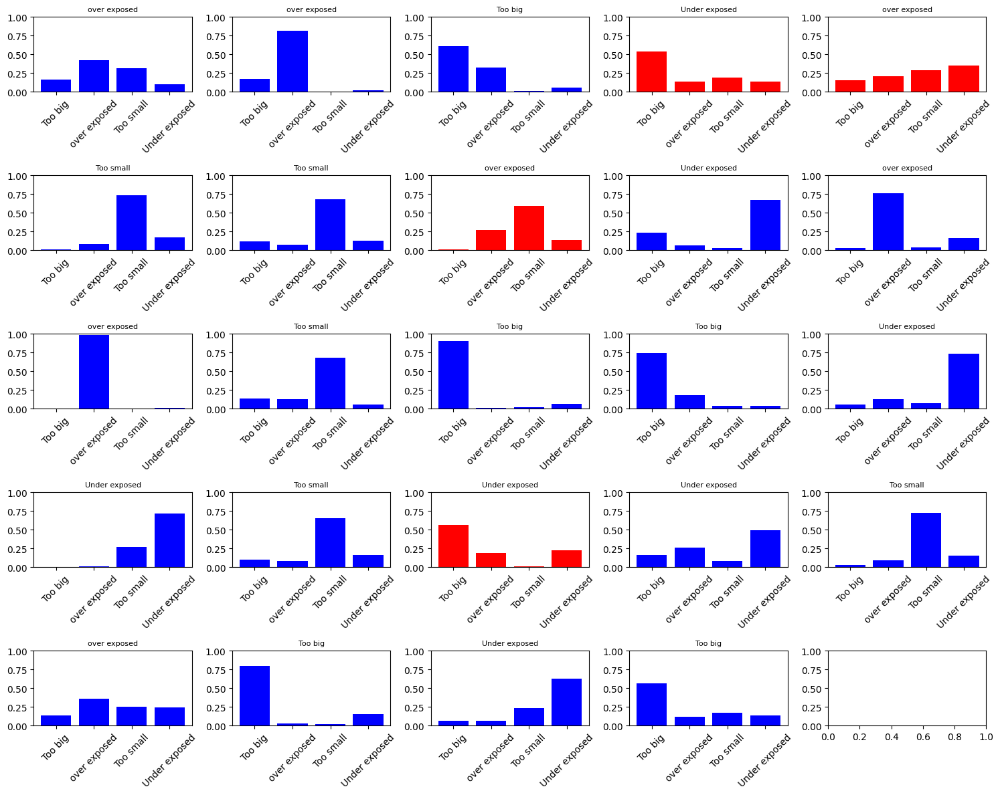

In [105]:
import matplotlib.pyplot as plt
import torch
import numpy as np

classes = ['Too big', 'over exposed', 'Too small', 'Under exposed']

logits = torch.cat(preds)

fig, axs = plt.subplots(5, 5, figsize=(15, 12))
axs = axs.flatten()

for i in range(min(25, len(logits))):
    probs = torch.softmax(logits[i], dim=0).detach().cpu().numpy()
    if probs.ndim == 0 or probs.shape[0] != len(classes):
        axs[i].text(0.5, 0.5, f"Fout: outputvorm {probs.shape}", ha='center', va='center', color='red', fontsize=10)
        axs[i].axis("off")
        continue

    true = labels[i].detach().cpu()
    true_indices = [true.item()]
    true_label_names = [classes[j] for j in true_indices] or ["Good"]

    predicted_index = int(torch.argmax(logits[i]).item())
    predicted_label_names = [classes[predicted_index]]

    is_correct = predicted_index == true_indices[0]

    bar_color = 'blue' if is_correct else 'red'

    axs[i].bar(classes, probs, color=bar_color)
    axs[i].set_ylim(0, 1)
    axs[i].set_title(" / ".join(true_label_names), fontsize=8)
    axs[i].tick_params(axis='x', labelrotation=45)

plt.tight_layout()
plt.show()

# Tensor
In de boxplot wordt er geteld tot 100%. Dit is alleen niet hoe de computer eigenlijk denkt maar dit is voor de mens makkelijker om te begrijpen. Het is wel leuk om naar de echte waardes te kijken van de computer omdat deze ook iets zeggen over hoe de computer denkt. Onder onderstaande cel staat tensor met 4 waardes. Deze corresponderen met de labels. We kunnen zien dat er een positief en drie negatieve getallen zijn. De negatieve getallen daarbij denkt de computer dat ze het niet kunnen zijn. Hoe dichter deze getallen bij de 0 zijn des te meer de classifier aan het twijfelen is of hij dit label heeft of niet. Zien we een heel groot min getal? Dan denkt de classifier dat het absoluut dit label niet kan zijn. Hetzelfde geldt andersom bij de positieve getallen. Hoe groter het positieve getal des te meer de classifier overtuigd is dat dit het label moet zijn.

In [98]:
from PIL import Image

img = Image.open("D:\\Minor\\Classification\\X-ray\\Oude data\\OG\\Too big\\IMG_9647.jpg")
a = transform(img)  

a = a.unsqueeze(0)  

model.eval()  
with torch.no_grad():
    p = model(a)  

print(p)

tensor([[ 1.1073, -0.4404, -4.8474, -2.6177]])


# Met code zelf testen
We kunnen nu zelf een afbeelding gaan invoeren. Dit kunnen we doen door de code: img = Image.open(pad naar je afbeelding) aan te passen met dus het pad naar jouw eigen afbeelding. Hieronder krijg je dan een visual met jou gekozen afbeelding en een box plot met de keuzes van de classifier. LET OP! Zoals je eerder hebt kunnen zien is de classifier niet 100% juist. Ga bij twijfel daarom altijd naar een docent of een betrouwbare bron.

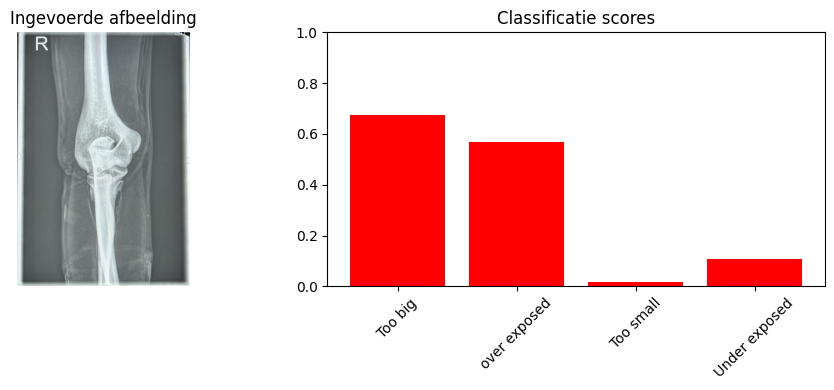

In [99]:
import torch
import matplotlib.pyplot as plt
from PIL import Image
import torchvision.transforms as transforms

model.eval()

classes = ['Too big', 'over exposed', 'Too small', 'Under exposed']

transform = transforms.Compose([
    transforms.Resize((224, 224)), 
    transforms.ToTensor(),
])

img = Image.open("D:\\Minor\\Classification\\X-ray\\Oude data\\OG\\Too big\\IMG_9647.jpg")
a = transform(img).unsqueeze(0) 

with torch.no_grad():
    p = model(a)

probs = torch.sigmoid(p.squeeze()).cpu().numpy()

fig, axs = plt.subplots(1, 2, figsize=(10, 4))

axs[0].imshow(img)
axs[0].axis('off')
axs[0].set_title("Ingevoerde afbeelding")

axs[1].bar(classes, probs, color='blue' if max(probs) <= 0.5 else 'red')
axs[1].set_ylim(0, 1)
axs[1].set_title("Classificatie scores")
axs[1].tick_params(axis='x', labelrotation=45)

plt.tight_layout()
plt.show()


# Zelf proberen via upload
Het is natuurlijk niet handig om iedere keer maar de weg van jou bestand in te moeten voeren. Zodra je de cel die hieronder staat laat draaiien komt er onderin een knop waarop op staat: Upload. Als je hierop klikt opent hij jou verkenner en kun je veel makkelijker een afbeelding invoeren. Hierbij krijg je hetzelfde als hierboven + de tensor cijfers die ik eerder heb uitgelegd om zelf ook nog naar te kijken. Je kunt blijven uploaden en de ouden blijven ook staan. Zodra je de cel opnieuw laad verdwijnen de afbeeldingen en kun je opnieuw beginnen. Als een plot rood kleurt dan betekent dit dat dit boven de 50% komt. Dit betekent dus dat er een fout in de afbeelding zit volgens de classifier. Als ze allemaal blauw zijn dan is de fout of niet groot genoeg of er is gewoon geen fout aanwezig.

FileUpload(value=(), accept='image/*', description='Upload')

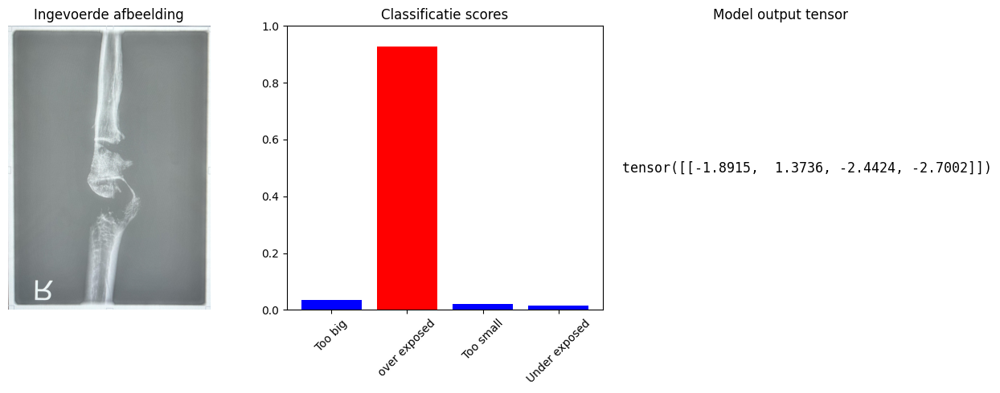

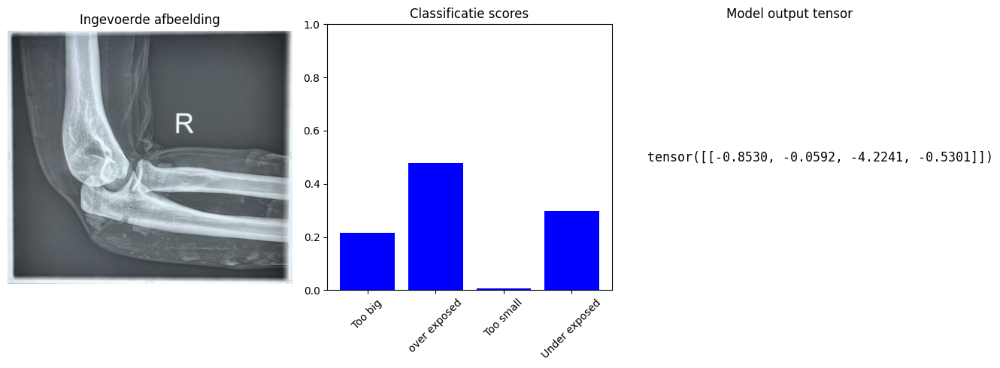

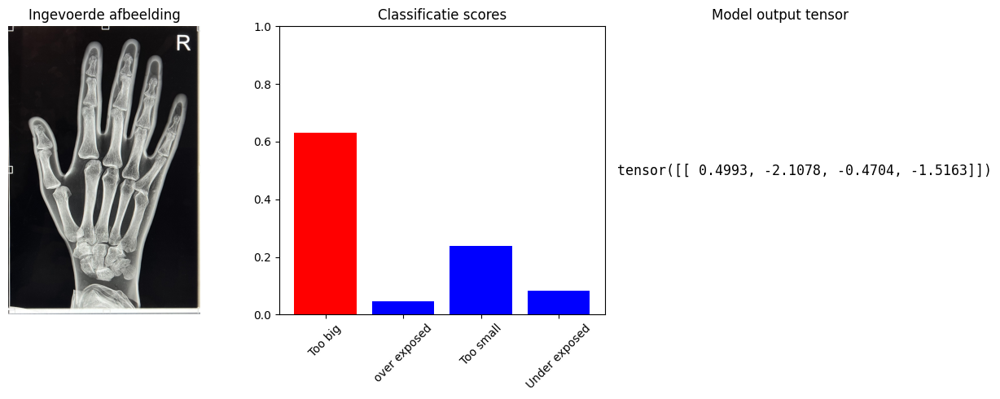

In [ ]:
import io
import torch
import matplotlib.pyplot as plt
from PIL import Image
import torchvision.transforms as transforms
import ipywidgets as widgets
from IPython.display import display

upload = widgets.FileUpload(accept='image/*', multiple=False)
display(upload)

def process_uploaded_image(image_bytes):
    img = Image.open(io.BytesIO(image_bytes)).convert('RGB')

    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
    ])
    x = transform(img)
    x = x.unsqueeze(0) 

    model.eval()
    with torch.no_grad():
        p = model(x)

    probs = torch.softmax(p.squeeze(), dim=0).cpu().numpy()

    tensor_str = str(p.cpu())

    fig = plt.figure(figsize=(14, 5))

    ax1 = plt.subplot2grid((1, 3), (0, 0))
    ax2 = plt.subplot2grid((1, 3), (0, 1))
    ax3 = plt.subplot2grid((1, 3), (0, 2))

    ax1.imshow(img)
    ax1.axis('off')
    ax1.set_title("Ingevoerde afbeelding")

    classes = ['Too big', 'over exposed', 'Too small', 'Under exposed']
    ax2.bar(classes, probs, color=['blue' if prob <= 0.5 else 'red' for prob in probs])
    ax2.set_ylim(0, 1)
    ax2.set_title("Classificatie scores")
    ax2.tick_params(axis='x', labelrotation=45)

    ax3.axis('off')
    ax3.text(0, 0.5, tensor_str, fontsize=12, va='center', ha='left', family='monospace')
    ax3.set_title("Model output tensor")

    plt.tight_layout()
    plt.show()

def on_upload_change(change):
    if upload.value:
        uploaded_file_info = upload.value[0]
        content = uploaded_file_info['content']
        process_uploaded_image(content)

upload.observe(on_upload_change, names='value')